In [181]:
!wget --header="Host: doc-0k-9c-docs.googleusercontent.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/71.0.3578.98 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://drive.google.com/drive/u/0/my-drive" --header="Cookie: AUTH_4lgch8kproorp87c5erpsi9rqpbk46dg=14696292948499217652|1547719200000|3qfpic6a1qbc65m1hemsuelhckkoq5in" --header="Connection: keep-alive" "https://doc-0k-9c-docs.googleusercontent.com/docs/securesc/0ga3her86at4fpdr2b9n3spfq1b4g359/j3o00daquhtht26rp616f8irn5v3dulg/1547726400000/14696292948499217652/14696292948499217652/168SeVOc42CiJ5CvUBCaNBTIbMlJ6I9J7?h=06864318269717761326&e=download" -O "Trigger Word Detection.zip" -c

--2019-01-17 13:43:00--  https://doc-0k-9c-docs.googleusercontent.com/docs/securesc/0ga3her86at4fpdr2b9n3spfq1b4g359/j3o00daquhtht26rp616f8irn5v3dulg/1547726400000/14696292948499217652/14696292948499217652/168SeVOc42CiJ5CvUBCaNBTIbMlJ6I9J7?h=06864318269717761326&e=download
Resolving doc-0k-9c-docs.googleusercontent.com (doc-0k-9c-docs.googleusercontent.com)... 74.125.133.132, 2a00:1450:400c:c07::84
Connecting to doc-0k-9c-docs.googleusercontent.com (doc-0k-9c-docs.googleusercontent.com)|74.125.133.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/x-zip-compressed]
Saving to: ‘Trigger Word Detection.zip’

Trigger Word Detect     [  <=>               ]  10.50M  17.7MB/s    in 0.6s    

2019-01-17 13:43:02 (17.7 MB/s) - ‘Trigger Word Detection.zip’ saved [11015391]



In [182]:
!unzip 'Trigger Word Detection.zip'

Archive:  Trigger Word Detection.zip
   creating: Trigger Word Detection/
  inflating: Trigger Word Detection/chime.wav  
   creating: Trigger Word Detection/data/
   creating: Trigger Word Detection/data/activates/
  inflating: Trigger Word Detection/data/activates/1.wav  
  inflating: Trigger Word Detection/data/activates/1_act2.wav  
  inflating: Trigger Word Detection/data/activates/1_act3.wav  
  inflating: Trigger Word Detection/data/activates/2.wav  
  inflating: Trigger Word Detection/data/activates/2_act2.wav  
  inflating: Trigger Word Detection/data/activates/2_act3.wav  
  inflating: Trigger Word Detection/data/activates/3.wav  
  inflating: Trigger Word Detection/data/activates/3_act2.wav  
  inflating: Trigger Word Detection/data/activates/3_act3.wav  
  inflating: Trigger Word Detection/data/activates/4_act2.wav  
   creating: Trigger Word Detection/data/backgrounds/
  inflating: Trigger Word Detection/data/backgrounds/1.wav  
  inflating: Trigger Word Detection/data/bac

In [183]:
cd 'Trigger Word Detection'

/content/Trigger Word Detection


**LISTENING TO THE AUDIO FILES**

In [0]:
import IPython

In [185]:
IPython.display.Audio('data/activates/1.wav')

In [186]:
IPython.display.Audio('data/backgrounds/1.wav')

In [187]:
IPython.display.Audio('data/negatives/1.wav')

**AUDIO TO SPECTROGRAMS**

The audio files here are of 44100Hz i.e. in 1 sec we have 44100 values for an audio file. We will pass the audio file through a function to form a spectogram which will pass a sliding window over the raw audio to collect the most active frequencies using Fourier transform. This will reduce the number of values for a 10 sec audio file to 5511(Tx)

In [0]:
import matplotlib.pyplot as plt
from scipy.io import wavfile
import os
from pydub import AudioSegment

In [0]:
# Load a wav file
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

In [0]:
# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    nfft = 200 # Length of each window segment
    fs = 8000 # Sampling frequencies
    noverlap = 120 # Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


<function print>

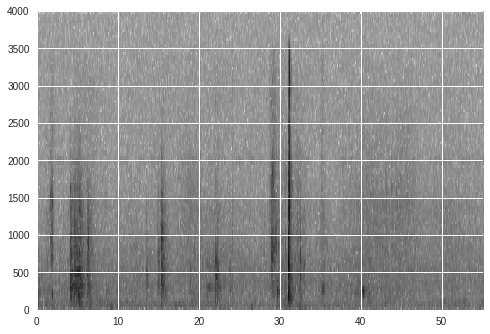

In [191]:
_, data = wavfile.read('data/backgrounds/1.wav')
spec = graph_spectrogram('data/backgrounds/1.wav')
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", spec.shape)

print

raw_data has total of 441000 time steps (10*44100)

spectrogram of the audio has 5511 time-steps and 101 different frequencies

In [0]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

**We wil be using 1375 as Ty, i.e. 10 sec audio will be splitted in 1375 values**

In [0]:
Ty = 1375 # The number of time steps in the output of our model

  **LOADING TRAINING SET**
  
**We will use pydub to load an audio file, it will split use 1ms to split an audio file i.e. 1 sec audio file will have 1000 values and 10sec audio file will have 10000 values**

In [0]:
def load_audio():
  activates = []
  backgrounds = []
  negatives = []
  for filename in os.listdir('data/activates'):
    if filename.endswith('wav'):
      activate = AudioSegment.from_wav('data/activates/'+filename)
      activates.append(activate)
  for filename in os.listdir('data/backgrounds'):
    if filename.endswith('wav'):
      background = AudioSegment.from_wav('data/backgrounds/'+filename)
      backgrounds.append(background)
  for filename in os.listdir('data/negatives'):
    if filename.endswith('wav'):
      negative = AudioSegment.from_wav('data/negatives/'+filename)
      negatives.append(negative)
  
  return activates, backgrounds, negatives

In [0]:
activates, backgrounds, negatives = load_audio()

In [196]:
print("background len: " + str(len(backgrounds[0])))    # Should be 10,000, since it is a 10 sec clip
print("activate[0] len: " + str(len(activates[0])))     # Maybe around 1000, since an "activate" audio clip is usually around 1 sec (but varies a lot)
print("activate[1] len: " + str(len(activates[1])))     # Different "activate" clips can have different lengths

background len: 10000
activate[0] len: 721
activate[1] len: 2392


**OVERLAYING ACTIVATES AND NEGATIVES OVER BACKGROUND**

We will overlay activates and negaives over background audio at random segments and ensure that none of them overlaps. This overlayed background will be used for training our model

In [0]:
def get_random_time_segment(segment_ms):  # segment_ms has value in ms
  segment_start = np.random.randint(low = 0, high = 10000 - segment_ms)
  segment_end = segment_start + segment_ms
  return (segment_start, segment_end)

In [0]:
def is_overlapping(segment_time, previous_segments):
  segment_start, segment_end = segment_time
  overlap = False
  for previous_start, previous_end in previous_segments:
    if (segment_end >= previous_start and segment_start <= previous_end) or (segment_start <= previous_end and segment_end >= previous_start):
      overlap = True
  return overlap

In [0]:
def insert_audio_clip(background, audio_clip, previous_segments):
  segment_ms = len(audio_clip)
  segment_time = get_random_time_segment(segment_ms)
  while is_overlapping(segment_time, previous_segments):
    segment_time = get_random_time_segment(segment_ms)
  
  previous_segments.append(segment_time)
  
  new_background = background.overlay(audio_clip, position = segment_time[0])
  return new_background, segment_time

**INSERTING ONES**

As per theory we will insert some extra 1s(50 here) after the point where the activate word ended. Since we will make y(t) values to 1 and Ty  = 1375, we need to find the exact point where the activate word ended in 1375 time-steps
for eg = if activate word ended at precise 5th sec in 10 sec audio clip, the time-step t from where y(t) will be set to 1 is 1375/2 + 1 = 688. so 688 to 737

formula for finding the start point to set y(t) = 1 is:

          int((segment_end/10000)*1375) + 1

In [0]:
def insert_ones(segment_end, y):
  segment_end_y = int(Ty*segment_end/10000.0)+1
  for i in range(segment_end_y, segment_end_y+50):
    if i < Ty:
      y[0, i] = 1
  
  return y

**CREATING ONE TRAINING EXAMPLE**

In [0]:
# Used to standardize volume of audio clip
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

In [0]:
def create_training_example(background, activates, negatives, filename):
  """
  Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    
  """
  # Make background quieter
  background = background - 20
  
  y = np.zeros((1, Ty))
  previous_segments = []
  
  # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
  number_of_activates = np.random.randint(0, 5)
  random_indices = np.random.randint(len(activates), size = number_of_activates)
  random_activates = [activates[i] for i in random_indices]
  
  for random_activate in random_activates:
    background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
    segment_start, segment_end = segment_time
    insert_ones(segment_end, y)
    
  # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
  number_of_negatives = np.random.randint(0, 3)
  random_indices = np.random.randint(len(negatives), size=number_of_negatives)
  random_negatives = [negatives[i] for i in random_indices]
    
  for random_negative in random_negatives:
    background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
  # Standardize the volume of the audio clip 
  background = match_target_amplitude(background, -20)
  
  file_handle = background.export(filename + '.wav', format = 'wav')
  print("file " + filename + ".wav" + " is saved in directory")
  
  x = graph_spectrogram(filename+'.wav')
  
  return x, y
    

file train_1.wav is saved in directory
file train_2.wav is saved in directory


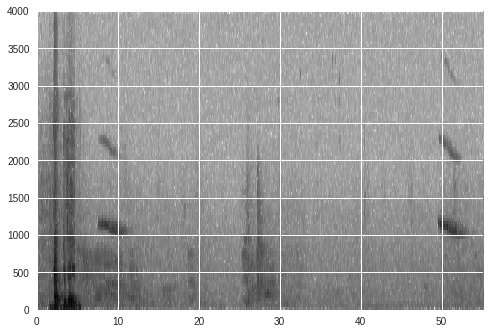

In [203]:
X = []
Y = []

for i in range(len(backgrounds)):
  x, y = create_training_example(backgrounds[i], activates, negatives, 'train_'+str(i+1))
  X.append(x)
  Y.append(y)

In [204]:
IPython.display.Audio('train_1.wav')

In [205]:
IPython.display.Audio('train_2.wav')

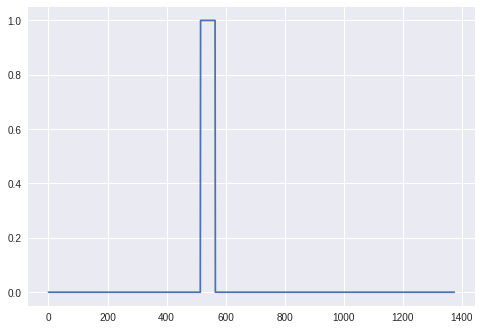

In [206]:
plt.plot(Y[0][0])

Since training example has shape (n_freq, Tx). We need to swap axes to make it's shape as required by the model. Same for Y also

In [0]:
for i in range(len(X)):
  X[i] = X[i].swapaxes(0,1)

In [208]:
X = np.array(X)
X.shape

(2, 5511, 101)

In [209]:
for i in range(len(Y)):
  Y[i] = Y[i].swapaxes(0,1)
Y = np.array(Y)
Y.shape

(2, 1375, 1)

**BUILDING THE MODEL**

In [0]:
from keras.models import load_model, Model
from keras.layers import Dense, Activation, Dropout, GRU, TimeDistributed, Input, Conv1D, BatchNormalization
from keras.optimizers import Adam

In [0]:
def TModel(input_shape):
  
  X_input = Input(input_shape)
  
  X = Conv1D(196, kernel_size = 15, strides = 4)(X_input) # these strides and kernel_size will convert 5511 to 1375
  X = BatchNormalization()(X)
  X = Activation('relu')(X)
  X = Dropout(0.8)(X)
  
  X = GRU(128, return_sequences = True)(X)
  X = Dropout(0.8)(X)
  X = BatchNormalization()(X)
  
  X = GRU(128, return_sequences = True)(X)
  X = Dropout(0.8)(X)
  X = BatchNormalization()(X)
  X = Dropout(0.8)(X)
  
  X = TimeDistributed(Dense(1, activation = 'sigmoid'))(X) #This creates a dense layer followed by a sigmoid, so that the parameters used for the dense layer are the same for every time step
  
  model = Model(inputs = X_input, outputs = X)
  return model

In [0]:
model = TModel((Tx, n_freq))

In [213]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_10 (Batc (None, 1375, 196)         784       
_________________________________________________________________
activation_4 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 1375, 196)         0         
_________________________________________________________________
gru_7 (GRU)                  (None, 1375, 128)         124800    
_________________________________________________________________
dropout_14 (Dropout)         (None, 1375, 128)         0         
__________

**VISUALISING MODEL**

In [0]:
from keras.utils import plot_model
plot_model(model, to_file = 'Trigger Word Detection Model.png', show_shapes = True)

In [0]:
opt = Adam(lr = 0.0001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.01)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ['accuracy'])

In [216]:
model.fit(X, Y, batch_size = 5, epochs = 10)

Epoch 1/10
2/2 [==============================] - 8s 4s/step - loss: 1.2252 - acc: 0.4945
Epoch 2/10
2/2 [==============================] - 5s 2s/step - loss: 1.2642 - acc: 0.5116
Epoch 3/10
2/2 [==============================] - 5s 2s/step - loss: 1.2182 - acc: 0.5105
Epoch 4/10
2/2 [==============================] - 5s 2s/step - loss: 1.2236 - acc: 0.4931
Epoch 5/10
2/2 [==============================] - 5s 2s/step - loss: 1.2479 - acc: 0.4905
Epoch 6/10
2/2 [==============================] - 5s 2s/step - loss: 1.2725 - acc: 0.5065
Epoch 7/10
2/2 [==============================] - 5s 2s/step - loss: 1.2402 - acc: 0.5069
Epoch 8/10
2/2 [==============================] - 5s 2s/step - loss: 1.2263 - acc: 0.5185
Epoch 9/10
2/2 [==============================] - 5s 2s/step - loss: 1.2426 - acc: 0.4927
Epoch 10/10
2/2 [==============================] - 5s 2s/step - loss: 1.2405 - acc: 0.4836


**LOADING WEIGHTS**

In [259]:
model = load_model('models/tr_model.h5')

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:327: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [260]:
model.evaluate(X, Y)

2/2 [==============================] - 4s 2s/step


[0.02064555510878563, 0.9941818118095398]

**MAKE PREDICTIONS**

In [0]:
def detect_triggerword(filename):
  x = graph_spectrogram(filename)
  x = x.swapaxes(0,1)
  x = np.expand_dims(x, axis = 0)
  predictions = model.predict(x)
  return predictions

Once you've estimated the probability of having detected the word "activate" at each output step, you can trigger a "chiming" sound to play when the probability is above a certain threshold. Further, $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. So we will insert a chime sound at most once every 75 output steps. This will help prevent us from inserting two chimes for a single instance of "activate".

In [0]:
chime_file = 'chime.wav'
def chime_on_activate(filename, predictions, threshold):
  audio_clip = AudioSegment.from_wav(filename)
  chime = AudioSegment.from_wav(chime_file)
  Ty = predictions.shape[1]
  consecutive_time_steps = 0
  for i in range(Ty):
    consecutive_time_steps+=1
    if predictions[0,i,0] > threshold and consecutive_time_steps > 75:
      audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
      consecutive_time_steps = 0
  audio_clip.export("chime_output.wav", format = 'wav')

**LISTENING TO THE TEST AUDIO**

In [267]:
IPython.display.Audio('test_audio.wav')

**PRE-PROCESSING THE TEST AUDIO FILE**

Making the audio file upto 10 sec using padding or segmenting

Setting frame rate of audio to 44100Hz , same as our train set

In [0]:
def preprocess_audio(filename):
  padding = AudioSegment.silent(duration = 10000)
  segment = AudioSegment.from_wav(filename)[:10000]
  segment = padding.overlay(segment)
  segment = segment.set_frame_rate(44100)
  segment.export('preprocessed_'+filename, format = 'wav')

In [0]:
preprocess_audio('test_audio.wav')

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:7609: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


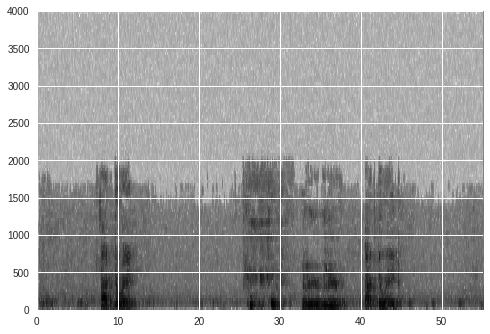

In [273]:
chime_threshold = 0.5
prediction = detect_triggerword('preprocessed_test_audio.wav')
chime_on_activate('preprocessed_test_audio.wav', prediction, chime_threshold)
IPython.display.Audio('chime_output.wav')